In [1]:
from keras.applications.nasnet import NASNetLarge
from keras.applications.resnet import ResNet50
from keras.preprocessing import image
from keras.applications.nasnet import preprocess_input
import keras

import tensorflow as tf

import numpy as np
import pandas as pd
import cv2
import sklearn
import matplotlib.pyplot as plt

import os
import random
import glob

/usr/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)
/usr/lib/python3.7/importlib/_bootstrap.py:219: RuntimeWarning: numpy.ufunc size changed, may indicate binary incompatibility. Expected 192 from C header, got 216 from PyObject
  return f(*args, **kwds)


In [2]:
model = NASNetLarge(weights='imagenet')
model.summary()

Model: "NASNet"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 331, 331, 3)  0                                            
__________________________________________________________________________________________________
stem_conv1 (Conv2D)             (None, 165, 165, 96) 2592        input_1[0][0]                    
__________________________________________________________________________________________________
stem_bn1 (BatchNormalization)   (None, 165, 165, 96) 384         stem_conv1[0][0]                 
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 165, 165, 96) 0           stem_bn1[0][0]                   
_____________________________________________________________________________________________

In [3]:
keras.utils.plot_model(model, show_shapes=True, show_layer_names=True)

In [7]:
del model

NameError: name 'model' is not defined

In [8]:
data = pd.read_csv(os.path.join("dataset", "Test.csv"), ",")

In [9]:
data.head()

,Width,Height,Roi.X1,Roi.Y1,Roi.X2,Roi.Y2,ClassId,Path
0,53,54,6,5,48,49,16,Test/00000.png
1,42,45,5,5,36,40,1,Test/00001.png
2,48,52,6,6,43,47,38,Test/00002.png
3,27,29,5,5,22,24,33,Test/00003.png
4,60,57,5,5,55,52,11,Test/00004.png


In [10]:
NUM_CLASSES = 43
IMG_SHAPE = (41,41,3)
DATASET_DIR = "dataset"

In [11]:
def get_dataset(data):
    data = sklearn.utils.shuffle(data)
    images = []
    labels = []
    for v in data.itertuples():
        image_path = os.path.join(DATASET_DIR, v.Path)
        image = cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        scaled_img = cv2.resize(image, (IMG_SHAPE[:2]))
        images.append(scaled_img)
        labels.append(int(v.ClassId))
    
    return np.array(images, dtype="float32")/255.0, labels

In [12]:
reference_annotation = pd.read_csv(os.path.join(DATASET_DIR, "Meta.csv"),
                                   ",")
x_reference, y_reference = get_dataset(reference_annotation)

In [13]:
train_annotation = pd.read_csv(os.path.join(DATASET_DIR, "Train.csv"), ",")
test_annotation = pd.read_csv(os.path.join(DATASET_DIR, "Test.csv"), ",")

In [14]:
x_train, y_train = get_dataset(train_annotation)
x_test, y_test = get_dataset(test_annotation)

In [15]:
reference_annotation = pd.read_csv(os.path.join(DATASET_DIR, "Meta.csv"), ",")
x_reference, y_reference = get_dataset(reference_annotation)

In [16]:
reference_array = np.array(sorted(zip(x_reference, y_reference),
                                  key=lambda v: v[1]))[:,0]

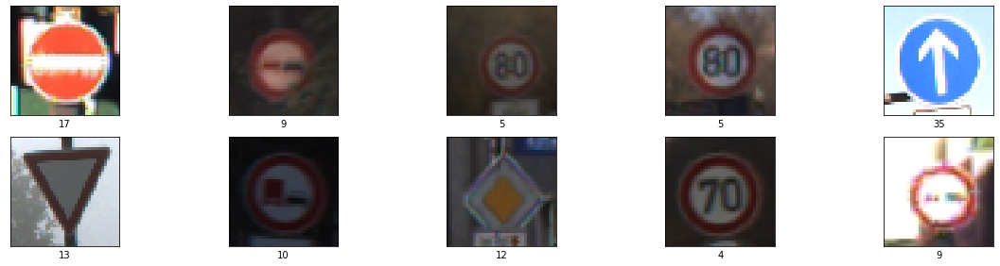

In [17]:
plt.figure(figsize=(20,20))
for num, im_id in enumerate(np.random.choice(len(x_train), 10)):
    plt.subplot(8,5,num+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x_train[im_id], cmap=plt.cm.binary)
    plt.xlabel(y_train[im_id])
    
plt.show()

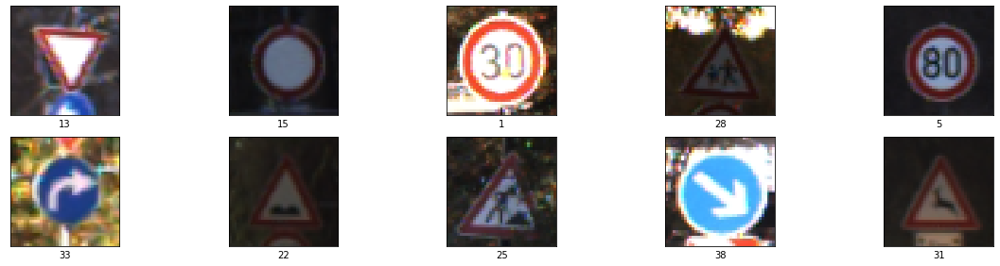

In [18]:
plt.figure(figsize=(20,20))
for num, im_id in enumerate(np.random.choice(len(x_test), 10)):
    plt.subplot(8,5,num+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x_test[im_id], cmap=plt.cm.binary)
    plt.xlabel(y_test[im_id])
    
plt.show()

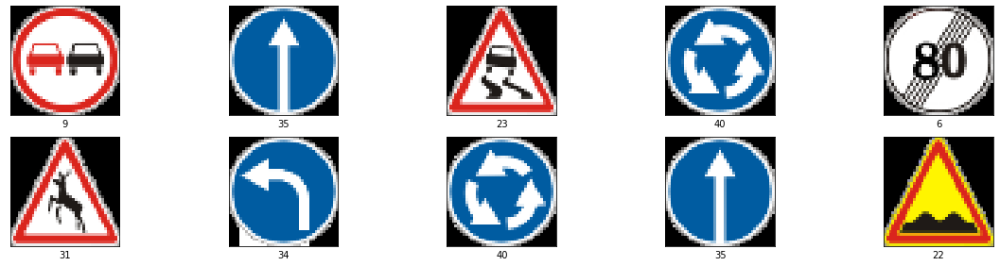

In [19]:
plt.figure(figsize=(20,20))
for num, im_id in enumerate(np.random.choice(len(x_reference), 10)):
    plt.subplot(8,5,num+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(x_reference[im_id], cmap=plt.cm.binary)
    plt.xlabel(y_reference[im_id])
    
plt.show()

In [22]:
base_model = ResNet50(include_top=False, weights='imagenet', 
                      input_shape=IMG_SHAPE, classes=NUM_CLASSES)

94773248/94765736 [==============================] - 12s 0us/step


In [23]:
base_model.summary()

Model: "resnet50"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 41, 41, 3)    0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 47, 47, 3)    0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 21, 21, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 21, 21, 64)   256         conv1_conv[0][0]                 
___________________________________________________________________________________________

In [24]:
x = base_model.output
x = keras.layers.Flatten()(x)
predictions = keras.layers.Dense(NUM_CLASSES, activation=tf.nn.softmax)(x)

model = keras.Model(inputs=base_model.input, outputs=predictions)

In [25]:
model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 41, 41, 3)    0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 47, 47, 3)    0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 21, 21, 64)   9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 21, 21, 64)   256         conv1_conv[0][0]                 
____________________________________________________________________________________________

In [26]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

Train on 31367 samples, validate on 7842 samples
Epoch 1/1
31367/31367 [==============================] - 53s 2ms/step - loss: 0.0454 - accuracy: 0.9880 - val_loss: 4.8405 - val_accuracy: 0.1004


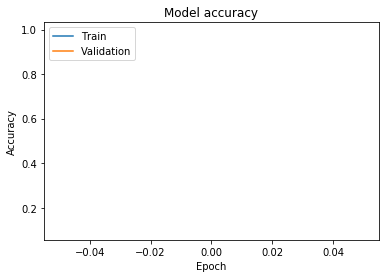

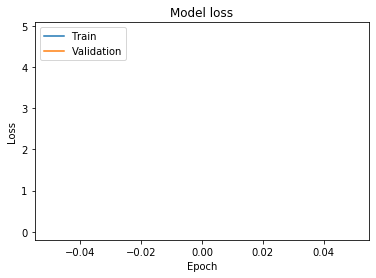

********************************************************************************


In [29]:
class HistoryDrawer(tf.keras.callbacks.Callback):
    global_log = {"accuracy":[], "val_accuracy":[], "loss":[], "val_loss":[]}
    def on_epoch_end(self, batch, logs={}):
        for k,v in logs.items():
            self.global_log[k].append(v)
        
        plt.plot(self.global_log['accuracy'])
        plt.plot(self.global_log['val_accuracy'])
        plt.title('Model accuracy')
        plt.ylabel('Accuracy')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        plt.show()

        plt.plot(self.global_log['loss'])
        plt.plot(self.global_log['val_loss'])
        plt.title('Model loss')
        plt.ylabel('Loss')
        plt.xlabel('Epoch')
        plt.legend(['Train', 'Validation'], loc='upper left')
        plt.show()
        print("********************************************************************************")
        
history_drawer = HistoryDrawer()
checkpointer = tf.keras.callbacks.ModelCheckpoint("./log/cp-{epoch:04d}.ckpt", verbose=1, period=3)

model.fit(x_train, y_train, 
            batch_size=256, 
            epochs=1, 
            validation_split=0.2, 
            callbacks=[history_drawer, checkpointer])

In [30]:
model.evaluate(x_test, y_test)

12630/12630 [==============================] - 10s 757us/step


[4.762447222545802, 0.09952493757009506]

In [31]:
def plot_prediction(image, prediction, reference_array):
    category_array = range(len(prediction))
    true_result_id = np.argmax(prediction)
    
    plt.figure(figsize=(14,10))
    
    plt.subplot(3,1,1)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(image, cmap=plt.cm.binary)
    plt.xlabel("'{}' - {:0.2f}%".format(category_array[true_result_id],
                            np.max(prediction)*100),
                            color='red')

    plt.subplot(3,1,2)
    plt.grid(False)
    plt.xticks([])
    plt.yticks([])
    plt.imshow(reference_array[true_result_id], cmap=plt.cm.binary)
    plt.xlabel("'{}'".format(category_array[true_result_id],
                            color='blue'))
    
    plt.subplot(3,1,3)
    plt.xticks(range(len(category_array)), category_array, rotation=45)
    thisplot = plt.bar(range(len(category_array)), prediction, color="#777777")
    plt.ylim([0,1])
    thisplot[true_result_id].set_color('red')
  
    
    plt.show()

In [49]:
predictions = model.predict(x_test)

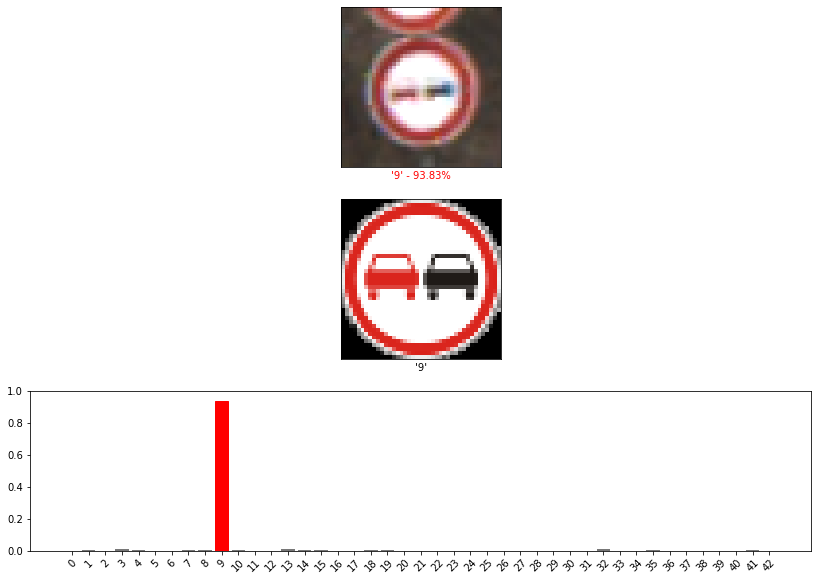

In [61]:
rand_el = random.randint(0, len(predictions)-1)
plot_prediction(x_test[rand_el], predictions[rand_el], reference_array)

In [62]:
model.save('resnet50_GTSRB.h5')